# MASTER THESIS - model of interior temperature

This notebook demonstrates the usage of the `DarkGreyBox` models via fitting them with `DarkGreyFit`

Model used: 
##### TiTmCn2R2C_summer_V9

Period:
##### 01/09 --> 15/09

## Importation

In [1]:
import sys
import importlib
from pathlib import Path
import pvlib
from scipy.interpolate import BSpline

# go from ...\docs\tutorials up two levels to the repo root (...\darkgreybox)
repo_root = Path.cwd().parents[1]
sys.path.insert(0, str(repo_root))
importlib.invalidate_caches()


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, KFold
from statsmodels.graphics.tsaplots import plot_pacf

from darkgreybox.models import TiTmCn2R2C_summer_V9_1
from darkgreybox.night_ventilation import simulate_night_vent_scenario, comfort_metrics
from darkgreybox.fit import darkgreyfit
from docs.tutorials.util.plot import plot
from docs.tutorials.util.error import rmse

C:\Users\clemr\AppData\Roaming\Python\Python311\site-packages\matplotlib\projections\__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


2026-04-14 21:15:49,801 darkgreybox  INFO     Logging enabled...


Our temporal resolution is 5 minutes

In [2]:
# the duration of a record (in h - 5 minutes)
rec_duration = 15/60

## Data Loading and Preprocessing

The data is loaded from the CSV file 'data_summer' and processed to extract relevant variables for the thermal model.

In [3]:
def add_bspline_features(df, n_knots=6, degree=3):
    """Add B-spline basis functions using datetime index."""
    # Extract hour of day from the index (assuming it's datetime)
    hour_of_day = df.index.hour + df.index.minute / 60
    
    # Knots from 6am to 8pm
    knots_interior = np.linspace(6, 20, n_knots)
    knots = np.concatenate([
        [knots_interior[0]] * (degree + 1),
        knots_interior,
        [knots_interior[-1]] * (degree + 1)
    ])
    
    n_basis = len(knots) - degree - 1
    
    for i in range(n_basis):
        coef = np.zeros(n_basis)
        coef[i] = 1.0
        bspline = BSpline(knots, coef, degree)
        df[f'bs_{i}'] = bspline(hour_of_day)
    
    return df, n_basis

In [4]:
input_df = pd.read_csv('./data/monthly_csv_exports_R05/2025-05_R05.csv', index_col=0, parse_dates=True)

# Dual sensor fusion
input_df['Ti']      = (input_df['R05_07_N_TRU01'] + input_df['R05_07_V_TRU01']) / 2
input_df['qv']      = input_df['R05_07_N_FCI01_1'] + input_df['R05_07_V_FCI01_1']  # total flow
input_df['c']       = (input_df['R05_07_N_CO201']  + input_df['R05_07_V_CO201'])  / 2

# External sensors – unchanged
input_df['Ta']      = input_df['HTR9_VES01_TUD01']
input_df['Ik']      = input_df['HTR9_VES01_SI01']
input_df['Tsup']    = input_df['HTRK_VEN01_TI01']
input_df['theta_z'] = input_df['HTR9_VES01_AZ01']
input_df['gamma_s'] = input_df['HTR9_VES01_SV01']

# Initial conditions
input_df['Ti0'] = input_df['Ti'].iloc[0]
input_df['Tm0'] = input_df['Ti'].iloc[0]
input_df['c0']  = input_df['c'].iloc[0]
input_df['N0']  = 0

# No neighbour rooms → remove T_neigh columns from input_X
input_X = input_df[['qv', 'c', 'Ta', 'Ik', 'Tsup', 'theta_z', 'gamma_s',
                     'Ti0', 'Tm0', 'c0', 'N0']]
input_y = input_df['Ti']

print(f'Input X shape: {input_X.shape}, input y shape: {input_y.shape}')

Input X shape: (2976, 11), input y shape: (2976,)


## Data Splitting

Initial conditions are set for the state variables at t=0, using the first measurements from the dataset. The data is then split into training (80%) and test (20%) sets for model validation.
`shuffle=False` to preserve the temporal order of the time series data. This is important for thermal modeling where historical context matters.

In [5]:
X_train, X_test, y_train, y_test = train_test_split(input_X, input_y, test_size=0.2, shuffle=False)

print(f'Train: X shape: {X_train.shape}, y shape: {y_train.shape}')
print(f'Test: X shape: {X_test.shape}, y shape: {y_test.shape}')

# Before training:
X_train, n_bsplines = add_bspline_features(X_train)
X_test, _ = add_bspline_features(X_test)
print(f"Created {n_bsplines} B-spline basis functions")

Train: X shape: (2380, 11), y shape: (2380,)
Test: X shape: (596, 11), y shape: (596,)
Created 10 B-spline basis functions


## Model Training Parameters and Physical Constants

The parameter ranges are carefully chosen to reflect realistic physical bounds and to ensure the optimizer does not hit artificial limits during fitting. Capacitances and resistances are estimated from building material properties and geometry, while internal gains and constants are set according to typical values found in literature or building standards. This approach balances physical realism with flexibility for model calibration.

In [23]:
S_room          = 154               # m²  ← NEW
A_windows_west  = 31.35             # m²  ← NEW (West facade)
A_windows_north = 31.61             # m²  ← NEW (North facade)
H_room          = 2.7               # m   (keep or update)
V_room          = S_room * H_room

orientation_west  = 270             # degrees (West)
orientation_north = 0               # degrees (North)

A_neigh_1 = 4*H_room                    # Surface of the neighbor wall 1 (m²) - estimated based on Revit
A_neigh_2 = 4*H_room                    # Surface of the neighbor wall 2 (m²) - estimated based on Revit
U_interior_wall = 1.8                   # U-value of interior walls (W/m²K) - single gypsum board + metal stud 

Rneih_1_i = 1/(U_interior_wall*A_neigh_1)
Rneih_2_i = 1/(U_interior_wall*A_neigh_2)


# Capacitances initial guesses
# C=ρ×V×c_p [J/K] (ρ density kg/m³, V volume m³, c_p specific heat capacity J/kgK)
rho_air_init = 1.2          # kg/m³
cp_air_init = 1005          # J/kgK
rho_furn_init = 500         # kg/m³
cp_furn_init = 1200         # J/kgK
V_furn_init = 0.1 * V_room  # m³  (10% of room volume as furniture/contents volume)
Ci_i = rho_air_init * V_room * cp_air_init + rho_furn_init * V_furn_init * cp_furn_init

rho_wall = 2200             # kg/m³
cp_conc  = 840              # J/kgK
wall_thickness = 0.1        # m
Cm_i = rho_wall * (S_room * wall_thickness) * cp_conc  



# Resistances initial guesses
# R=1/(U*A) or 1/(h*A) [K/W]
h_conv = 8                     # W/m²K
S_int_mass = 0.6 * S_room      # internal surfaces area ~60%
Rim_i = 1 / (h_conv * S_int_mass)

U_env = 0.25                   # W/m²K
Rout_i= 1 / (U_env * S_room)


# Capacitances and resistances variation ranges
# WIDENED based on optimizer hitting bounds (see diagnostic cell)
Ci_min = 0.05*Ci_i      # Was 0.2x → lowered (optimizer wanted smaller)
Ci_max = 2*Ci_i         # Keep similar
Cm_min = 0.1*Cm_i       # Was 0.5x → lowered (optimizer wanted smaller)
Cm_max = 3*Cm_i         # Keep similar

Rim_min = 0.2*Rim_i     # Slightly lower
Rim_max = 2*Rim_i       # Keep similar
Rout_min = 0.1*Rout_i   # Was 0.5x → lowered (optimizer wanted more heat loss)
Rout_max = 2*Rout_i     # Keep similar



# Define training parameters
train_params_TiTmCn2R2C_summer_V4 = {
    'Ti0': {'value': input_df.iloc[0]['Ti0'], 'vary': False},               # Initial indoor temperature
    'Tm0': {'value': input_df.iloc[0]['Tm0'], 'vary': False},               # Initial thermal mass temperature
    'c0': {'value': input_df.iloc[0]['c0'], 'vary': False},                 # Initial CO2 concentration
    'N0': {'value': 3.0, 'vary': True, 'min': 0, 'max': 15},                 # Initial number of occupants
    
    #'Ci': {'value': Ci_i, 'vary': True, 'min': Ci_min, 'max': Ci_max},      # Air + light internal components heat capacity at air node (fast mass at Ti)
    #'Cm': {'value': Cm_i, 'vary': True, 'min': Cm_min, 'max': Cm_max},      # Thermal mass heat capacity (heavy structural mass at Tm)
    #'Rim': {'value': Rim_i, 'vary': True, 'min': Rim_min, 'max': Rim_max},  # Thermal resistance indoor air ↔ thermal mass (heat air ↔ building structure)
    #'Rout': {'value': Rout_i, 'vary': True, 'min': Rout_min, 'max': Rout_max},  # Overall thermal resistance indoor air ↔ ambient/outdoor air (heat loss path)
    'Ci':   {'value': 25000,      'vary': True, 'min': 1000,       'max': 300000},
    #'Cm':   {'value': 110000000,  'vary': True, 'min': 10000000,   'max': 1000000000},
    'Cm': {'value': 109454659, 'vary': True, 'min': 1000000, 'max': 200000000},
    'Rim':  {'value': 0.005,      'vary': True, 'min': 0.0005,     'max': 0.05},
    'Rout': {'value': 0.011,      'vary': True, 'min': 0.001,      'max': 0.1}, 
    'q_pers': {'value': 75, 'vary': False},                                 # Internal gains per person
    'q_equip_var': {'value': 80, 'vary': False},                            # Variable equipment gains per person
    'q_equip_const': {'value': 1, 'vary': True, 'min': 0, 'max': 3},  # W/m²
    'V': {'value': S_room*H_room, 'vary': False},                           # Volume of the room
    'S': {'value': S_room, 'vary': False},                                  # Surface of the room
    # ── NEW: two-facade geometry ──────────────────────────────────────────
    'A_west':         {'value': A_windows_west,   'vary': False},
    'A_north':        {'value': A_windows_north,  'vary': False},
    'gamma_g_west':   {'value': 270,              'vary': False},
    'gamma_g_north':  {'value': 0,                'vary': False},
    'G': {'value': 0.016, 'vary': False},                                   # Global radiation factor
    'c_out': {'value': 400, 'vary': False},                                 # Outdoor CO2 concentration
    'rho_air': {'value': 1.2, 'vary': False},                               # Air density
    'cp_air': {'value': 1000, 'vary': False},                               # Specific heat capacity of air
    #'g': {'value': 0.55, 'vary': False},                                    # total solar energy transmittance of the glazing 
    'alpha':  {'value': 0.1,   'vary': True, 'min': 0.01, 'max': 0.5},
    'n': {'value': 1.526, 'vary': False},                                        # refractive index for IAM calculation
    'K': {'value': 4, 'vary': False},                                   # absorption coefficient for IAM calculation (1/m)
    'L': {'value': 0.003, 'vary': False},                                     # glazing thickness for IAM calculation (m)
    'f_sol':  {'value': 0.4,   'vary': True, 'min': 0, 'max': 1},         # Solar gains distribution factor (fraction of solar gains directly affecting indoor air node)
    # 10 B-spline coefficients
    # ── West facade B-splines (10 coefficients) ───────────────────────────
    'phi_a': {'value': 0.7, 'vary': True, 'min': 0, 'max': 1},
    'phi_b': {'value': 0.7, 'vary': True, 'min': 0, 'max': 1},
    'phi_c': {'value': 0.7, 'vary': True, 'min': 0, 'max': 1},
    'phi_d': {'value': 0.7, 'vary': True, 'min': 0, 'max': 1},
    'phi_e': {'value': 0.7, 'vary': True, 'min': 0, 'max': 1},
    'phi_f': {'value': 0.7, 'vary': True, 'min': 0, 'max': 1},
    'phi_g': {'value': 0.7, 'vary': True, 'min': 0, 'max': 1},
    'phi_h': {'value': 0.7, 'vary': True, 'min': 0, 'max': 1},
    'phi_i': {'value': 0.7, 'vary': True, 'min': 0, 'max': 1},
    'phi_j': {'value': 0.7, 'vary': True, 'min': 0, 'max': 1},

    # ── NEW: North facade B-splines (10 coefficients) ─────────────────────
    'phi_a_n': {'value': 0.3, 'vary': True, 'min': 0, 'max': 1},
    'phi_b_n': {'value': 0.3, 'vary': True, 'min': 0, 'max': 1},
    'phi_c_n': {'value': 0.3, 'vary': True, 'min': 0, 'max': 1},
    'phi_d_n': {'value': 0.3, 'vary': True, 'min': 0, 'max': 1},
    'phi_e_n': {'value': 0.3, 'vary': True, 'min': 0, 'max': 1},
    'phi_f_n': {'value': 0.3, 'vary': True, 'min': 0, 'max': 1},
    'phi_g_n': {'value': 0.3, 'vary': True, 'min': 0, 'max': 1},
    'phi_h_n': {'value': 0.3, 'vary': True, 'min': 0, 'max': 1},
    'phi_i_n': {'value': 0.3, 'vary': True, 'min': 0, 'max': 1},
    'phi_j_n': {'value': 0.3, 'vary': True, 'min': 0, 'max': 1},
}

# Verify stability
print(f"dt = {rec_duration:.4f} hours ({rec_duration * 60:.2f} minutes)")

dt = 0.2500 hours (15.00 minutes)


### 1: Initial conditions
Set up our initial conditions parameters map for testing

### 2: Error metric
To evaluate the performance of our models we will need to define an error metric. Again, there is a wide range of options available from `sklearn`

### 3: Fit method
Under the hood, `DarkGreyBox` uses `lmfit.minimize` to fit the thermal model parameters to the training data by passing it a custom objective function defined by the model class. The fit method used by `lmfit.minimize` can be customised as well. The standard Nelder-Mead and Levenberg-Marquardt methods work well in general. Here we use the Nelder-Mead method.

### 4: Choice of the model

In [25]:
ic_params_map = {
    'Ti0': lambda _X_test, y_test, _train_result: y_test.iloc[0],
    'Tm0': lambda X_test, _y_test, train_result: train_result.var['Tm'][-1] if 'Tm' in train_result.var else X_test.iloc[0]['Tm0'],
    'c0': lambda X_test, _y_test, train_result: train_result.var['c'][-1] if 'c' in train_result.var else X_test.iloc[0]['c0'],
    'N0': lambda X_test, _y_test, train_result: train_result.var['N'][-1] if 'N' in train_result.var else X_test.iloc[0]['N0'],
}

error_metric = rmse

method = 'nelder'

models = [TiTmCn2R2C_summer_V9_1(train_params_TiTmCn2R2C_summer_V4, rec_duration)]

Now, it is time to run the simulation:

In [26]:
# Run the darkgreyfit
df = darkgreyfit(
    models=models,
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    ic_params_map=ic_params_map,
    error_metric=error_metric,
    prefit_filter=None,
    prefit_splits=None,
    method=method,
    n_jobs=1
)

print("Fitting complete!")
print(f"DataFrame shape: {df.shape}")

df

model = df.iloc[0][('train', 'model')]
train_results = df.iloc[0][('train', 'model_result')]
test_results = df.iloc[0][('test', 'model_result')]

# Display model parameters safely
if hasattr(model, "result") and hasattr(model.result, "params"):
    display(model.result.params)
else:
    print("Model parameters not available.")

# Print initial, real initial guess (used in fit), and estimated R and C values
# Initial parameter guesses (from physical calculations)
try:
    init_params = {
        'Ci': {'value': Ci_i},
        'Cm': {'value': Cm_i},
        'Rim': {'value': Rim_i},
        'Rout': {'value': Rout_i}
    }
except NameError:
    # If any of the variables are not defined, set to None
    init_params = {
        'Ci': {'value': None},
        'Cm': {'value': None},
        'Rim': {'value': None},
        'Rout': {'value': None}
    }

# Real initial guess used in fit (from train_params_TiTmCn2R2C_summer)
real_init_params = {}
for key in ['Ci', 'Cm', 'Rim', 'Rout']:
    try:
        real_init_params[key] = train_params_TiTmCn2R2C_summer_V4[key]['value']
    except Exception:
        real_init_params[key] = None

if hasattr(model, "result") and hasattr(model.result, "params"):
    est_params = model.result.params
    print("Parameter   | Initial Guess (calc) | Real Initial Guess (used) | Estimated Value")
    print("--------------------------------------------------------------------------")
    for key in ['Ci', 'Cm', 'Rim', 'Rout']:
        init_val = init_params[key]['value']
        real_init_val = real_init_params[key]
        est_val = est_params[key].value if key in est_params else None
        if init_val is not None and real_init_val is not None and est_val is not None:
            print(f"{key:10} | {init_val:18.4f} | {real_init_val:23.4f} | {est_val:15.4f}")
        elif init_val is not None and real_init_val is not None:
            print(f"{key:10} | {init_val:18.4f} | {real_init_val:23.4f} | {'N/A':>15}")
        elif real_init_val is not None and est_val is not None:
            print(f"{key:10} | {'N/A':>18} | {real_init_val:23.4f} | {est_val:15.4f}")
        elif init_val is not None and est_val is not None:
            print(f"{key:10} | {init_val:18.4f} | {'N/A':>23} | {est_val:15.4f}")
        else:
            print(f"{key:10} | {'N/A':>18} | {'N/A':>23} | {'N/A':>15}")
else:
    print("Model parameters not available for comparison.")

2026-04-14 22:12:25,751 darkgreybox  INFO     Training models...
2026-04-14 22:16:55,228 darkgreybox  INFO     Generating predictions for 1 models...
Fitting complete!
DataFrame shape: (1, 13)


name,value,initial value,min,max,vary
Ti0,22.9000000,23.299999999999997,-inf,inf,False
Tm0,23.3046395,23.299999999999997,-inf,inf,False
c0,508.299747,484.26976549999995,-inf,inf,False
N0,3.2077e-57,0.0,0.00000000,15.0000000,True
Ci,3012.40563,25000.0,1000.00000,300000.000,True
Cm,1.7751e+08,109454659.0,1000000.00,2.0000e+08,True
Rim,0.00298402,0.005,5.0000e-04,0.05000000,True
Rout,0.02660762,0.011,1.0000e-03,0.10000000,True
q_pers,75.0000000,75.0,-inf,inf,False
q_equip_var,80.0000000,80.0,-inf,inf,False


Parameter   | Initial Guess (calc) | Real Initial Guess (used) | Estimated Value
--------------------------------------------------------------------------
Ci         |      25449454.8000 |              25000.0000 |       3012.4056
Cm         |      28459200.0000 |          109454659.0000 |  177505466.1838
Rim        |             0.0014 |                  0.0050 |          0.0030
Rout       |             0.0260 |                  0.0110 |          0.0266


# emcee approach for MCMC

Step 1 - Wrap your model as a callable

In [27]:
import emcee
import numpy as np


PARAM_NAMES = [
    'Ci', 'Cm', 'Rim', 'Rout',
    # ── Occupancy & internal gains ────────────────────────────────────────────
    'N0',                                  # ← NEW: vary=True in lmfit
    'q_equip_const',                       # ← NEW: vary=True in lmfit (W/m²)
    # ── Physical/optical ──────────────────────────────────────────────────────
    'alpha',                               # ← NOW vary=True
    'f_sol',                               # ← NOW vary=True
    # West facade B-splines
    'phi_a', 'phi_b', 'phi_c', 'phi_d', 'phi_e',
    'phi_f', 'phi_g', 'phi_h', 'phi_i', 'phi_j',
    # North facade B-splines  ← NEW
    'phi_a_n', 'phi_b_n', 'phi_c_n', 'phi_d_n', 'phi_e_n',
    'phi_f_n', 'phi_g_n', 'phi_h_n', 'phi_i_n', 'phi_j_n',
]

BOUNDS = {
    # ── Thermal RC parameters (aligned with lmfit train_params) ──────────────
    'Ci':       (1_000,        300_000),       # was (100, 10_000)
    'Cm':       (1_000_000,    200_000_000),   # was (1_000, 50_000)
    'Rim':      (0.0005,       0.05),          # was (0.001, 0.01)
    'Rout':     (0.001,        0.1),           # was (0.01, 1.0)
    # ── Occupancy & equipment ─────────────────────────────────────────────────
    'N0':            (0,               15),          # persons, matches lmfit
    'q_equip_const': (0,               3),           # W/m², matches lmfit

    # ── Physical/optical ──────────────────────────────────────────────────────
    'alpha':         (0.01,            0.5),         # CO2 filter, matches lmfit
    'f_sol':         (0.0,             1.0),         # solar split factor, matches lmfit

    # ── West facade B-spline coefficients ────────────────────────────────────
    **{f'phi_{c}':   (0.0, 1.0) for c in 'abcdefghij'},

    # ── North facade B-spline coefficients (new) ─────────────────────────────
    **{f'phi_{c}_n': (0.0, 1.0) for c in 'abcdefghij'},
}

Step 2 — Log-prior, log-likelihood, log-posterior

In [28]:
def log_prior(theta):
    for val, name in zip(theta, PARAM_NAMES):
        lo, hi = BOUNDS[name]
        if not (lo <= val <= hi):
            return -np.inf           # hard wall at physical bounds
    return 0.0                       # uniform prior within bounds
    # For Gaussian priors, replace with:
    # return -0.5 * ((val - mu) / sigma_prior)**2


def _as_lmfit_params(params_template):
    """Accept lmfit.Parameters OR the original train-params dict."""
    import copy
    import lmfit

    if isinstance(params_template, lmfit.Parameters):
        return copy.deepcopy(params_template)

    if isinstance(params_template, dict):
        p = lmfit.Parameters()
        for k, v in params_template.items():
            if not isinstance(v, dict):
                raise TypeError(f"Parameter '{k}' must be a dict, got {type(v)}")
            p.add(k, **v)
        return p

    raise TypeError(
        f"params_template must be lmfit.Parameters or dict, got {type(params_template)}"
    )


def run_model_with_theta(theta, X, params_template):
    """Inject MCMC theta vector into params and run forward model."""
    params = _as_lmfit_params(params_template)

    for name, val in zip(PARAM_NAMES, theta):
        params[name].value = float(val)

    model_instance = TiTmCn2R2C_summer_V9_1(params, rec_duration)
    result = model_instance.model(params, X)
    return np.asarray(result.Z, dtype=float)   # Ti prediction array


def log_likelihood(theta, X_dict, y_obs, params_template):
    Ti_pred = run_model_with_theta(theta, X_dict, params_template)

    if np.any(np.isnan(Ti_pred)) or np.any(np.isinf(Ti_pred)):
        return -np.inf
    if Ti_pred.shape[0] != len(y_obs):
        return -np.inf

    # Estimate noise sigma from residuals (or treat as free param)
    sigma = 0.3  # degC — tune or sample this too
    residuals = np.asarray(y_obs, dtype=float) - Ti_pred
    return -0.5 * np.sum((residuals / sigma)**2 + np.log(2 * np.pi * sigma**2))


def log_posterior(theta, X_dict, y_obs, params_template):
    lp = log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(theta, X_dict, y_obs, params_template)

Step 3 — Initialize walkers from Nelder-Mead solution

In [29]:
# Warm-start: use your fitted Nelder-Mead result as the center
theta_map = np.array([model.result.params[n].value for n in PARAM_NAMES])

ndim     = len(PARAM_NAMES)
nwalkers = max(4 * ndim, 64)   # rule-of-thumb: ≥ 2*ndim, 4x is safer

# Small Gaussian ball around the MAP estimate
rng = np.random.default_rng(42)
p0 = theta_map + 1e-3 * rng.standard_normal((nwalkers, ndim)) * theta_map

# Convert X_train to dict of arrays (emcee needs picklable args)
X_dict = {col: X_train[col].values for col in X_train.columns}
y_obs  = y_train.values

sampler = emcee.EnsembleSampler(
    nwalkers, ndim, log_posterior,
    args=(X_dict, y_obs, train_params_TiTmCn2R2C_summer_V4),
    moves=[emcee.moves.DEMove(), emcee.moves.DESnookerMove()],  # better for correlated params
)

Step 4 — Run burn-in + production

In [30]:
# Burn-in phase
print("Running burn-in...")
state = sampler.run_mcmc(p0, nsteps=500, progress=True)
sampler.reset()

# Production run
print("Running production...")
sampler.run_mcmc(state, nsteps=2000, progress=True)

# Extract flat samples
flat_samples = sampler.get_chain(discard=200, thin=15, flat=True)
print(f"Posterior samples shape: {flat_samples.shape}")

# ── NEW: acceptance fraction check ──────────────────────────────────────
acc = np.mean(sampler.acceptance_fraction)
print(f"\nMean acceptance fraction: {acc:.3f}")
if acc < 0.1:
    print("  ⚠ Too low (<0.1) — walkers are stuck. Consider fewer nsteps or wider bounds.")
elif acc > 0.7:
    print("  ⚠ Too high (>0.7) — walkers barely moving. Proposals may be too small.")
else:
    print("  ✓ Acceptance fraction looks healthy (target: 0.2–0.5)")

# ── NEW: autocorrelation time check ─────────────────────────────────────
try:
    tau = sampler.get_autocorr_time(quiet=True)
    print(f"\nAutocorrelation times (need nsteps > 50×tau):")
    for name, t in zip(PARAM_NAMES, tau):
        flag = "⚠ need more steps" if 2000 < 50 * t else "✓"
        print(f"  {name:12s}: tau={t:.1f}  (50×tau={50*t:.0f})  {flag}")
except Exception as e:
    print(f"Autocorr could not be computed yet: {e}")

# ── NEW: print median ± uncertainty for every parameter ─────────────────
print(f"\nParameter estimates (median +84th / -16th percentile):")
for i, name in enumerate(PARAM_NAMES):
    mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
    q = np.diff(mcmc)
    print(f"  {name:12s}: {mcmc[1]:.5f}  +{q[1]:.5f} / -{q[0]:.5f}")

Running burn-in...


100%|██████████| 500/500 [05:13<00:00,  1.60it/s]


Running production...


100%|██████████| 2000/2000 [06:53<00:00,  4.84it/s]


Posterior samples shape: (13440, 28)

Mean acceptance fraction: 0.028
  ⚠ Too low (<0.1) — walkers are stuck. Consider fewer nsteps or wider bounds.
2026-04-14 22:33:11,144 emcee.autocorr WARNING  The chain is shorter than 50 times the integrated autocorrelation time for 28 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 40;
tau: [182.94577608 175.39276315 197.35808709 169.58125109 213.29159858
 178.05394049 174.11601071 284.52949389 157.35124463 168.03217747
 281.55370056 205.65664688 179.79378749 282.43027154 169.45357279
 213.75192505 174.17647512 228.61543924 245.65946487 253.73080092
 228.43816253 234.44534035 172.89862598 179.14774055 248.54885665
 176.49181608 191.53135978 233.82144734]

Autocorrelation times (need nsteps > 50×tau):
  Ci          : tau=182.9  (50×tau=9147)  ⚠ need more steps
  Cm          : tau=175.4  (50×tau=8770)  ⚠ need more steps
  Rim         : tau=197.4  (50×tau=9868)  ⚠ need more steps
  Rout        : tau=169.6  (50×tau=8479)  

Step 5 — Analyze posteriors

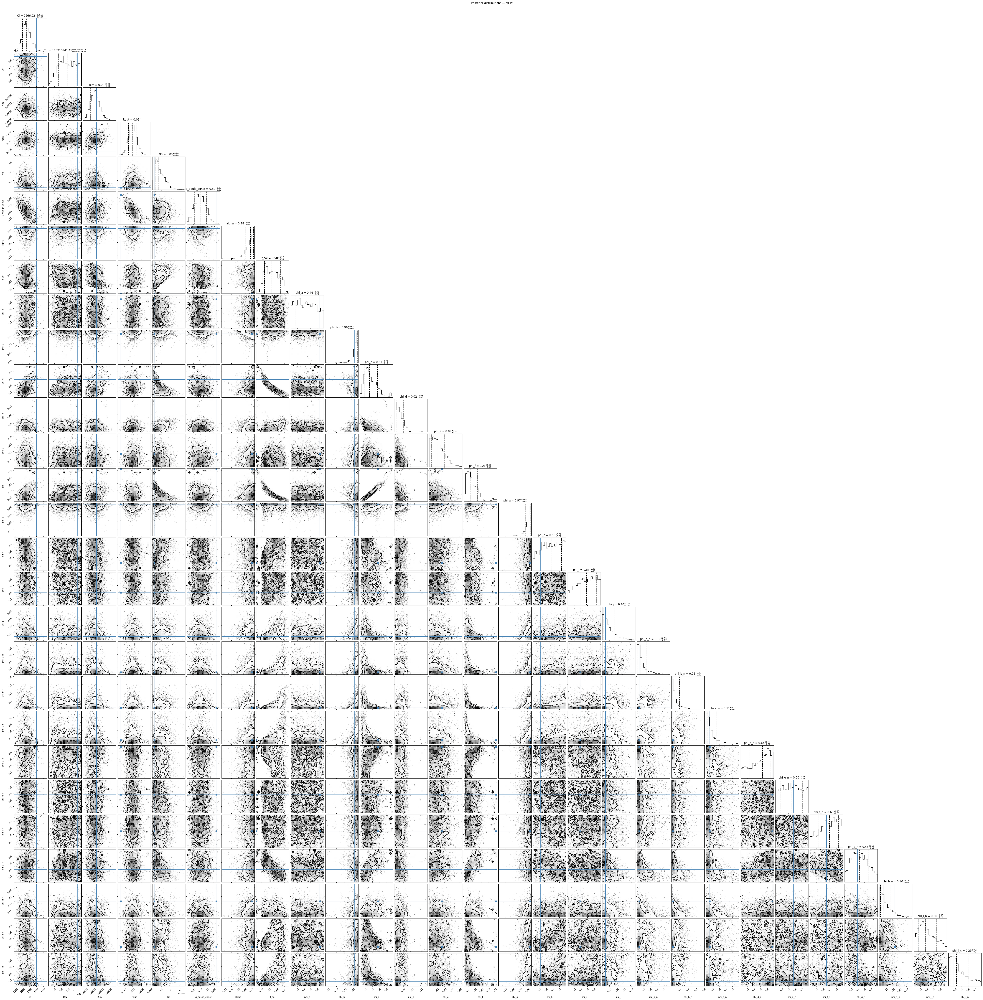

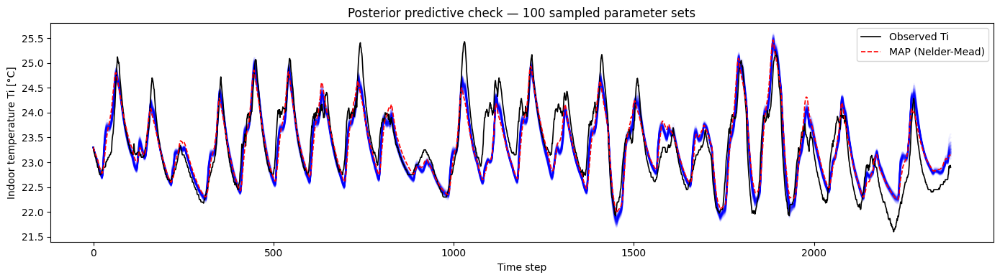

In [31]:
import matplotlib.pyplot as plt
import corner

# ── Corner plot ──────────────────────────────────────────────────────────
fig = corner.corner(
    flat_samples,
    labels=PARAM_NAMES,
    truths=theta_map,
    quantiles=[0.16, 0.5, 0.84],
    show_titles=True
)
fig.suptitle("Posterior distributions — MCMC", y=1.01)
plt.show()

# ── Posterior predictive check ───────────────────────────────────────────
fig2, ax = plt.subplots(figsize=(14, 4))                # ← NEW: explicit figure

rng_plot = np.random.default_rng(0)
for i in range(100):
    idx     = rng_plot.integers(len(flat_samples))
    theta_s = flat_samples[idx]
    Ti_pred = run_model_with_theta(theta_s, X_dict, train_params_TiTmCn2R2C_summer_V4)
    ax.plot(Ti_pred, alpha=0.05, color='blue')

ax.plot(y_obs, 'k-', linewidth=1.2, label='Observed Ti')
ax.plot(                                                 # ← NEW: MAP prediction in red
    run_model_with_theta(theta_map, X_dict, train_params_TiTmCn2R2C_summer_V4),
    'r--', linewidth=1.2, label='MAP (Nelder-Mead)'
)
ax.set_xlabel("Time step")
ax.set_ylabel("Indoor temperature Ti [°C]")
ax.set_title("Posterior predictive check — 100 sampled parameter sets")
ax.legend()
plt.tight_layout()
plt.show()

In [32]:
import pandas as pd
from sklearn.metrics import mean_squared_error

# ── Helper: run model with proper IC handoff train→test ──────────────────
def run_model_with_theta_and_ic(theta, X_dict_train, X_dict_test, y_train_arr, params_template):
    """
    Step 1: run on training set → extract final states (Tm, c, N)
    Step 2: set test ICs from those final states + y_test[0] for Ti0
    Step 3: run on test set
    """
    import copy, lmfit

    def make_params(extra_ic=None):
        params = _as_lmfit_params(params_template)
        for name, val in zip(PARAM_NAMES, theta):
            params[name].value = float(val)
        if extra_ic:
            for k, v in extra_ic.items():
                params[k].value = float(v)
        return params

    # Step 1 — training run to get final states
    p_train = make_params()
    m_train = TiTmCn2R2C_summer_V9_1(p_train, rec_duration)
    r_train = m_train.model(p_train, X_dict_train)
    Ti_train = np.asarray(r_train.Z, dtype=float)

    # Step 2 — build test initial conditions
    test_ic = {
        'Ti0': y_train_arr[-1],                         # last observed Ti in train
        'Tm0': r_train.var['Tm'][-1] if 'Tm' in r_train.var else y_train_arr[-1],
        'c0':  r_train.var['c'][-1]  if 'c'  in r_train.var else params_template['c0']['value'],
        'N0':  r_train.var['N'][-1]  if 'N'  in r_train.var else 0.0,
    }

    # Step 3 — test run with correct ICs
    p_test = make_params(extra_ic=test_ic)
    m_test = TiTmCn2R2C_summer_V9_1(p_test, rec_duration)
    r_test = m_test.model(p_test, X_dict_test)
    Ti_test = np.asarray(r_test.Z, dtype=float)

    return Ti_train, Ti_test


# ── 1. Parameter summary table ───────────────────────────────────────────
rows = []
for i, name in enumerate(PARAM_NAMES):
    lo, hi = BOUNDS[name]
    p16, p50, p84 = np.percentile(flat_samples[:, i], [16, 50, 84])
    map_val = theta_map[i]
    hitting_lower = abs(p16 - lo) / max(hi - lo, 1e-10) < 0.02
    hitting_upper = abs(p84 - hi) / max(hi - lo, 1e-10) < 0.02
    flag = "⚠ lower bound" if hitting_lower else ("⚠ upper bound" if hitting_upper else "✓")
    rows.append({
        'Parameter':    name,
        'MAP (Nelder)': round(map_val, 6),
        'MCMC median':  round(p50, 6),
        '-1σ (16th)':   round(p50 - p16, 6),
        '+1σ (84th)':   round(p84 - p50, 6),
        'Bound [lo, hi]': f"[{lo:.4g}, {hi:.4g}]",
        'Status': flag
    })

param_df = pd.DataFrame(rows)
display(param_df)

# ── 2. RMSE comparison with correct IC handoff ───────────────────────────
theta_mcmc_median = np.array([np.percentile(flat_samples[:, i], 50) for i in range(ndim)])

X_dict_test = {col: X_test[col].values for col in X_test.columns}
y_obs_test  = y_test.values

# MAP
Ti_map_train, Ti_map_test = run_model_with_theta_and_ic(
    theta_map, X_dict, X_dict_test, y_obs, train_params_TiTmCn2R2C_summer_V4)

# MCMC median
Ti_mcmc_train, Ti_mcmc_test = run_model_with_theta_and_ic(
    theta_mcmc_median, X_dict, X_dict_test, y_obs, train_params_TiTmCn2R2C_summer_V4)

rmse = lambda y, yhat: np.sqrt(mean_squared_error(y, yhat))

print("── RMSE ─────────────────────────────────────────────")
print(f"  {'':20s}  {'Train':>10}  {'Test':>10}")
print(f"  {'MAP (Nelder-Mead)':20s}  {rmse(y_obs, Ti_map_train):>10.4f}  {rmse(y_obs_test, Ti_map_test):>10.4f}")
print(f"  {'MCMC median':20s}  {rmse(y_obs, Ti_mcmc_train):>10.4f}  {rmse(y_obs_test, Ti_mcmc_test):>10.4f}")

# ── 3. Posterior predictive band — FIXED coverage formula ────────────────
sigma_obs = 0.3   # °C — your likelihood noise assumption

n_samples = 300
idx_s = np.random.default_rng(1).integers(len(flat_samples), size=n_samples)

Ti_ensemble = np.stack([
    run_model_with_theta_and_ic(
        flat_samples[i], X_dict, X_dict_test, y_obs, train_params_TiTmCn2R2C_summer_V4
    )[0]   # [0] = train prediction
    for i in idx_s
])

band_mean = Ti_ensemble.mean(axis=0)
band_std  = Ti_ensemble.std(axis=0)   # parametric uncertainty only

# Full predictive std = parametric uncertainty + observation noise
pred_std  = np.sqrt(band_std**2 + sigma_obs**2)

coverage = np.mean(
    (y_obs >= band_mean - 2*pred_std) & (y_obs <= band_mean + 2*pred_std)
) * 100

print(f"\n── Posterior predictive band (train) ─────────────────")
print(f"  Parametric std (band):  {band_std.mean():.4f} °C  ← uncertainty from parameters alone")
print(f"  Observation noise σ:    {sigma_obs:.4f} °C  ← assumed in likelihood")
print(f"  Total prediction std:   {pred_std.mean():.4f} °C  ← sqrt(param² + noise²)")
print(f"  Coverage within ±2σ:    {coverage:.1f}%")
print(f"  (ideal: ~95% — if low, increase sigma_obs; if >99%, decrease it)")

,Parameter,MAP (Nelder),MCMC median,-1σ (16th),+1σ (84th),"Bound [lo, hi]",Status
0,Ci,3.012406e+03,2.566021e+03,1.742964e+02,1.992293e+02,"[1000, 3e+05]",⚠ lower bound
1,Cm,1.775055e+08,1.159109e+08,5.290706e+07,5.709633e+07,"[1e+06, 2e+08]",✓
2,Rim,2.984000e-03,2.905000e-03,2.150000e-04,2.450000e-04,"[0.0005, 0.05]",✓
3,Rout,2.660800e-02,3.202500e-02,1.841000e-03,1.922000e-03,"[0.001, 0.1]",✓
4,N0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,"[0, 15]",⚠ lower bound
5,q_equip_const,1.099164e+00,4.994510e-01,2.214760e-01,2.291510e-01,"[0, 3]",✓
6,alpha,4.837590e-01,4.756970e-01,3.152600e-02,1.785200e-02,"[0.01, 0.5]",⚠ upper bound
7,f_sol,1.983790e-01,5.047510e-01,1.405260e-01,1.654730e-01,"[0, 1]",✓
8,phi_a,8.772700e-01,4.636830e-01,3.100310e-01,3.317110e-01,"[0, 1]",✓
9,phi_b,9.270610e-01,9.585530e-01,5.582700e-02,3.005100e-02,"[0, 1]",⚠ upper bound


── RMSE ─────────────────────────────────────────────
                             Train        Test
  MAP (Nelder-Mead)         0.3810      0.4692
  MCMC median               0.3467      0.3872

── Posterior predictive band (train) ─────────────────
  Parametric std (band):  0.0399 °C  ← uncertainty from parameters alone
  Observation noise σ:    0.3000 °C  ← assumed in likelihood
  Total prediction std:   0.3030 °C  ← sqrt(param² + noise²)
  Coverage within ±2σ:    92.8%
  (ideal: ~95% — if low, increase sigma_obs; if >99%, decrease it)


### Re-run with the new MCMC parameters

In [33]:
import copy

# ── Wrapper that holds everything plot() might need ──────────────────────
class MockResult:
    def __init__(self, Z, var=None):
        self.Z   = Z
        self.var = var if var is not None else {}

# ── Updated helper: returns full result objects, not just Ti arrays ──────
def run_model_with_theta_and_ic_full(theta, X_dict_train, X_dict_test, y_train_arr, params_template):
    def make_params(extra_ic=None):
        params = _as_lmfit_params(params_template)
        for name, val in zip(PARAM_NAMES, theta):
            params[name].value = float(val)
        if extra_ic:
            for k, v in extra_ic.items():
                params[k].value = float(v)
        return params

    # Step 1 — training run
    p_train  = make_params()
    m_train  = TiTmCn2R2C_summer_V9_1(p_train, rec_duration)
    r_train  = m_train.model(p_train, X_dict_train)

    # Step 2 — test ICs from end of training run
    test_ic = {
        'Ti0': y_train_arr[-1],
        'Tm0': r_train.var['Tm'][-1] if 'Tm' in r_train.var else y_train_arr[-1],
        'c0':  r_train.var['c'][-1]  if 'c'  in r_train.var else params_template['c0']['value'],
        'N0':  r_train.var['N'][-1]  if 'N'  in r_train.var else 0.0,
    }

    # Step 3 — test run
    p_test = make_params(extra_ic=test_ic)
    m_test = TiTmCn2R2C_summer_V9_1(p_test, rec_duration)
    r_test = m_test.model(p_test, X_dict_test)

    # Wrap both into MockResult so .Z and .var work downstream
    train_mock = MockResult(np.asarray(r_train.Z, dtype=float), r_train.var)
    test_mock  = MockResult(np.asarray(r_test.Z,  dtype=float), r_test.var)

    return train_mock, test_mock


# ── 1. Extract MCMC median parameter vector ──────────────────────────────
theta_mcmc_median = np.array([np.percentile(flat_samples[:, i], 50) for i in range(ndim)])

# ── 2. Run forward model ─────────────────────────────────────────────────
X_dict_test = {col: X_test[col].values for col in X_test.columns}

train_results, test_results = run_model_with_theta_and_ic_full(
    theta_mcmc_median,
    X_dict, X_dict_test,
    y_train.values,
    train_params_TiTmCn2R2C_summer_V4
)
# y_train and y_test are observed data — they never change

print("── RMSE after MCMC parameter update ─────────────────────")
print(f"  Train RMSE: {rmse(y_train.values, train_results.Z):.4f} °C")
print(f"  Test  RMSE: {rmse(y_test.values,  test_results.Z):.4f} °C")

# ── 3. Convergence diagnostics ───────────────────────────────────────────
try:
    tau = sampler.get_autocorr_time(quiet=True)
    ess = (2000 / tau).astype(int)
    print("\n── Convergence diagnostics ───────────────────────────────")
    print(f"  {'Parameter':12s}  {'tau':>8}  {'ESS':>8}  {'Status'}")
    print(f"  {'-'*50}")
    for name, t, e in zip(PARAM_NAMES, tau, ess):
        flag = "⚠ need more steps" if 2000 < 50 * t else "✓"
        print(f"  {name:12s}  {t:>8.1f}  {e:>8d}  {flag}")
except Exception as ex:
    print(f"Autocorr could not be computed: {ex}")

acc = np.mean(sampler.acceptance_fraction)
print(f"\n  Mean acceptance fraction: {acc:.3f}")
if acc < 0.1:
    print("  ⚠ Too low — walkers stuck. Widen bounds or increase nsteps.")
elif acc > 0.7:
    print("  ⚠ Too high — walkers barely moving.")
else:
    print("  ✓ Healthy (target: 0.2–0.5)")

── RMSE after MCMC parameter update ─────────────────────
  Train RMSE: 0.3467 °C
  Test  RMSE: 0.3872 °C
2026-04-14 22:34:43,657 emcee.autocorr WARNING  The chain is shorter than 50 times the integrated autocorrelation time for 28 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 40;
tau: [182.94577608 175.39276315 197.35808709 169.58125109 213.29159858
 178.05394049 174.11601071 284.52949389 157.35124463 168.03217747
 281.55370056 205.65664688 179.79378749 282.43027154 169.45357279
 213.75192505 174.17647512 228.61543924 245.65946487 253.73080092
 228.43816253 234.44534035 172.89862598 179.14774055 248.54885665
 176.49181608 191.53135978 233.82144734]

── Convergence diagnostics ───────────────────────────────
  Parameter          tau       ESS  Status
  --------------------------------------------------
  Ci               182.9        10  ⚠ need more steps
  Cm               175.4        11  ⚠ need more steps
  Rim              197.4        10  ⚠ need more 

# Save the results

In [37]:
import pickle

RESULTS_FILE = "simulation_results_mcmc_2025_05_R05.pkl"

save_data = {
    "df":           df,
    "X_train":      X_train,
    "y_train":      y_train,
    "X_test":       X_test,
    "y_test":       y_test,
    "model":        model,
    "train_results": train_results,
    "test_results":  test_results,
}

with open(RESULTS_FILE, "wb") as f:
    pickle.dump(save_data, f)

print(f"Results and data saved to '{RESULTS_FILE}'")

# ── Print available attributes on result objects so get_var is always correct ─
print("\nAvailable attributes on train_results:")
print([a for a in dir(train_results) if not a.startswith('_')])


Results and data saved to 'simulation_results_mcmc_2025_05_R05.pkl'

Available attributes on train_results:
['Z', 'var']


## Train results

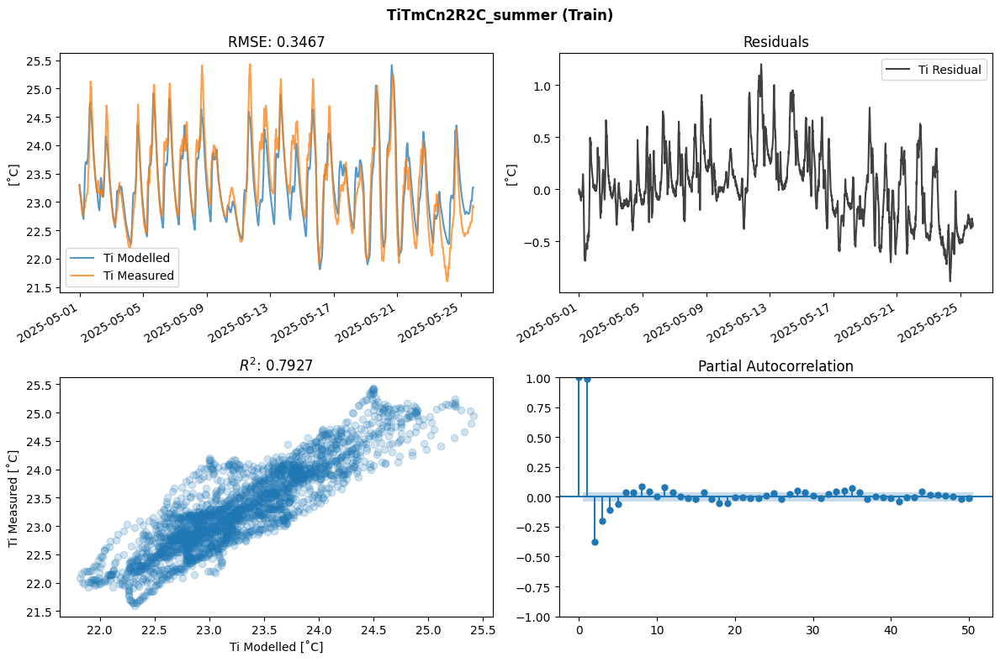

In [35]:
plot(y_train, train_results, 'TiTmCn2R2C_summer (Train)')

## Test results

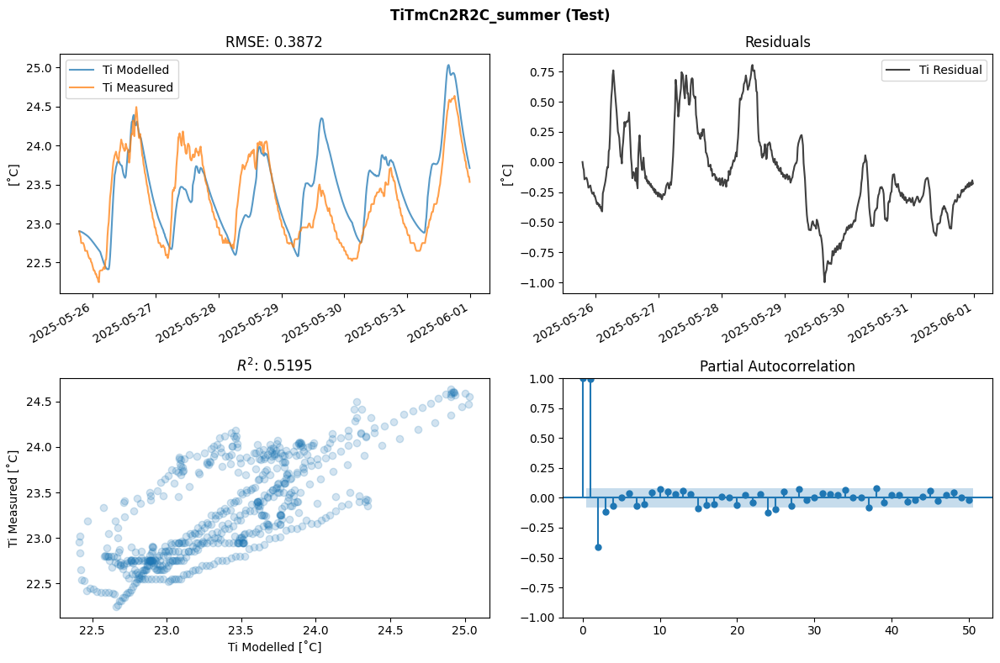

In [36]:
plot(y_test, test_results, 'TiTmCn2R2C_summer (Test)')

         EXTENDED MODEL VALIDATION REPORT (TEST)

── GOODNESS OF FIT (free-run simulation) ───────────────────
  RMSE:              0.4706 °C
  MAE:               0.4000 °C
  NRMSE (by range):  0.1969
  R²:                0.2901

── LIKELIHOOD-BASED CRITERIA ───────────────────────────────
  Log-Likelihood:     -447.5776
  AIC (lower=better): 943.1553
  BIC (lower=better): 1048.5211
  Parameters varied:  24

── RESIDUAL STATISTICS (free-run) ──────────────────────────
  Mean:     -0.302992 °C  (ideal ≈ 0)
  Std Dev:  0.360416 °C
  Skewness: 0.330572    (ideal ≈ 0)
  Kurtosis: -0.396374    (ideal ≈ 0)

── RESIDUAL STATISTICS (one-step-ahead) ────────────────────
  Mean:     0.000004 °C  (ideal ≈ 0)
  Std Dev:  0.048776 °C
  Skewness: 0.242244    (ideal ≈ 0)
  Kurtosis: 3.728820    (ideal ≈ 0)

── NORMALITY TESTS — one-step (H0: Gaussian) ──────────────
  Shapiro-Wilk:  W=0.951982,  p=5.393e-13  ✗ Not Normal
  Jarque-Bera:   JB=350.5251,  p=7.664e-77  ✗ Not Normal

── LJUNG-BOX — one-ste

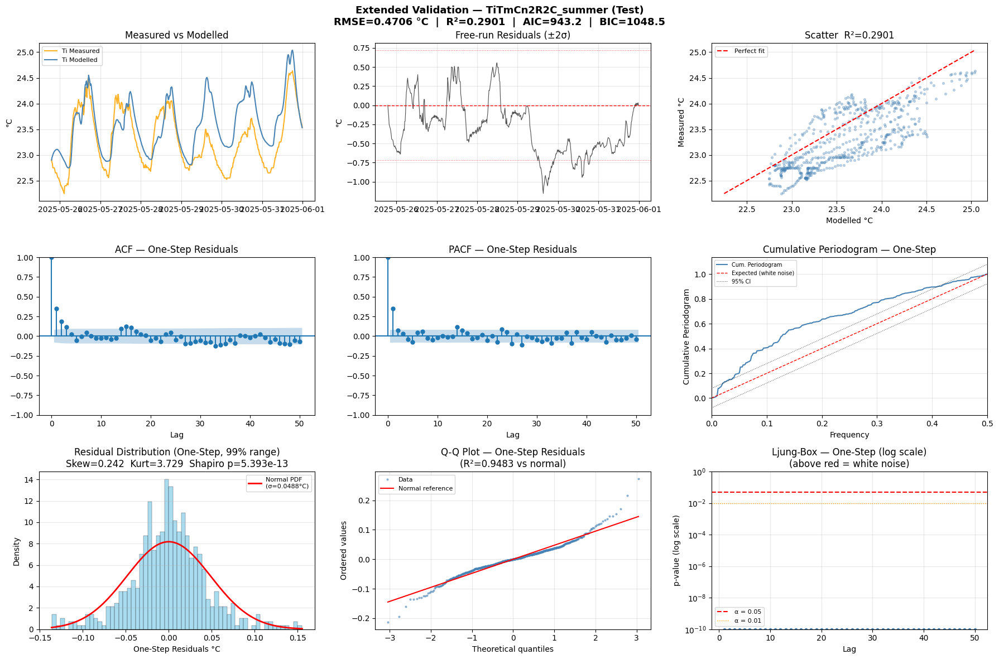

In [19]:
# ============================================================
# EXTENDED MODEL VALIDATION — FINAL VERSION (v3)
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from scipy import signal, stats
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
import warnings
warnings.filterwarnings('ignore')

# ----------------------------------------------------------
# 1. EXTRACT RESIDUALS — TWO TYPES
# ----------------------------------------------------------
Ti_measured  = y_test.values
Ti_modelled  = test_results.var['Ti']

# FREE-RUN → RMSE, R², MAE, scatter, time series
residuals    = Ti_measured - Ti_modelled
n            = len(residuals)

# ONE-STEP-AHEAD → ACF, PACF, Periodogram, Ljung-Box
residuals_1s = np.diff(residuals)
n1           = len(residuals_1s)

# ----------------------------------------------------------
# 2. COMPUTE ALL METRICS
# ----------------------------------------------------------

# Goodness of fit (free-run)
rmse_val  = np.sqrt(np.mean(residuals**2))
mae_val   = np.mean(np.abs(residuals))
ss_res    = np.sum(residuals**2)
ss_tot    = np.sum((Ti_measured - np.mean(Ti_measured))**2)
r2_val    = 1 - (ss_res / ss_tot)
nrmse_val = rmse_val / (Ti_measured.max() - Ti_measured.min())

# Likelihood-based metrics (free-run)
sigma2  = np.var(residuals, ddof=1)
log_lik = -0.5 * n * np.log(2 * np.pi * sigma2) - 0.5 * np.sum(residuals**2) / sigma2
if 'model' in locals() and hasattr(model, 'result') and hasattr(model.result, 'params'):
    k_params = sum(1 for p in model.result.params.values() if getattr(p, 'vary', False))
else:
    k_params = sum(1 for p in train_params_TiTmCn2R2C_summer_V4.values()
                   if isinstance(p, dict) and p.get('vary', False))
aic_val = -2 * log_lik + 2 * k_params
bic_val = -2 * log_lik + k_params * np.log(n)

# Free-run residual statistics
res_mean = np.mean(residuals)
res_std  = np.std(residuals, ddof=1)
res_skew = stats.skew(residuals)
res_kurt = stats.kurtosis(residuals)

# One-step residual statistics
res1_mean = np.mean(residuals_1s)
res1_std  = np.std(residuals_1s, ddof=1)
res1_skew = stats.skew(residuals_1s)
res1_kurt = stats.kurtosis(residuals_1s)

# Normality tests (one-step)
shapiro_stat, shapiro_p = stats.shapiro(residuals_1s[:min(5000, n1)])
jb_stat, jb_p           = stats.jarque_bera(residuals_1s)

# Ljung-Box (one-step)
lb_results = acorr_ljungbox(residuals_1s, lags=[1, 6, 12, 24, 48], return_df=True)

# ----------------------------------------------------------
# 3. PRINT VALIDATION REPORT  (scientific notation for p)
# ----------------------------------------------------------
def fmt_p(p):
    """Format p-value: show more precision, switch to sci notation if tiny."""
    if p < 0.0001:
        return f"{p:.3e}"
    return f"{p:.6f}"

print("=" * 65)
print("         EXTENDED MODEL VALIDATION REPORT (TEST)")
print("=" * 65)

print("\n── GOODNESS OF FIT (free-run simulation) ───────────────────")
print(f"  RMSE:              {rmse_val:.4f} °C")
print(f"  MAE:               {mae_val:.4f} °C")
print(f"  NRMSE (by range):  {nrmse_val:.4f}")
print(f"  R²:                {r2_val:.4f}")

print("\n── LIKELIHOOD-BASED CRITERIA ───────────────────────────────")
print(f"  Log-Likelihood:     {log_lik:.4f}")
print(f"  AIC (lower=better): {aic_val:.4f}")
print(f"  BIC (lower=better): {bic_val:.4f}")
print(f"  Parameters varied:  {k_params}")

print("\n── RESIDUAL STATISTICS (free-run) ──────────────────────────")
print(f"  Mean:     {res_mean:.6f} °C  (ideal ≈ 0)")
print(f"  Std Dev:  {res_std:.6f} °C")
print(f"  Skewness: {res_skew:.6f}    (ideal ≈ 0)")
print(f"  Kurtosis: {res_kurt:.6f}    (ideal ≈ 0)")

print("\n── RESIDUAL STATISTICS (one-step-ahead) ────────────────────")
print(f"  Mean:     {res1_mean:.6f} °C  (ideal ≈ 0)")
print(f"  Std Dev:  {res1_std:.6f} °C")
print(f"  Skewness: {res1_skew:.6f}    (ideal ≈ 0)")
print(f"  Kurtosis: {res1_kurt:.6f}    (ideal ≈ 0)")

print("\n── NORMALITY TESTS — one-step (H0: Gaussian) ──────────────")
print(f"  Shapiro-Wilk:  W={shapiro_stat:.6f},  p={fmt_p(shapiro_p)}  "
      f"{'✓ Normal' if shapiro_p > 0.05 else '✗ Not Normal'}")
print(f"  Jarque-Bera:   JB={jb_stat:.4f},  p={fmt_p(jb_p)}  "
      f"{'✓ Normal' if jb_p > 0.05 else '✗ Not Normal'}")

print("\n── LJUNG-BOX — one-step (H0: white noise) ─────────────────")
print(f"  {'Lag':<6} {'Q-stat':>10} {'p-value':>14}  Result")
print(f"  {'-'*46}")
for lag in [1, 6, 12, 24, 48]:
    row    = lb_results.loc[lag]
    result = '✓ White noise' if row['lb_pvalue'] > 0.05 else '✗ Autocorrelation'
    print(f"  {lag:<6} {row['lb_stat']:>10.4f} {fmt_p(row['lb_pvalue']):>14}  {result}")
print("=" * 65)

# ----------------------------------------------------------
# 4. DIAGNOSTIC PLOTS
# ----------------------------------------------------------
fig, axes = plt.subplots(3, 3, figsize=(18, 12))
fig.suptitle(
    f'Extended Validation — TiTmCn2R2C_summer (Test)\n'
    f'RMSE={rmse_val:.4f} °C  |  R²={r2_val:.4f}  |  AIC={aic_val:.1f}  |  BIC={bic_val:.1f}',
    fontsize=13, fontweight='bold'
)

time_idx    = y_test.index
time_idx_1s = y_test.index[1:]

# ── Plot 1: Time series ──────────────────────────────────
ax = axes[0, 0]
ax.plot(time_idx, Ti_measured, label='Ti Measured', color='orange',    lw=1.5, alpha=0.85)
ax.plot(time_idx, Ti_modelled, label='Ti Modelled', color='steelblue', lw=1.5)
ax.set_ylabel('°C')
ax.set_title('Measured vs Modelled')
ax.legend(fontsize=8); ax.grid(alpha=0.3)

# ── Plot 2: Free-run residuals ───────────────────────────
ax = axes[0, 1]
ax.plot(time_idx, residuals, color='black', lw=0.8, alpha=0.7)
ax.axhline(0,          color='red', ls='--', lw=1)
ax.axhline( 2*res_std, color='red', ls=':',  lw=0.8, alpha=0.6)
ax.axhline(-2*res_std, color='red', ls=':',  lw=0.8, alpha=0.6)
ax.set_ylabel('°C')
ax.set_title('Free-run Residuals (±2σ)')
ax.grid(alpha=0.3)

# ── Plot 3: Scatter ──────────────────────────────────────
ax = axes[0, 2]
ax.scatter(Ti_modelled, Ti_measured, alpha=0.3, s=8, color='steelblue')
lo = min(Ti_modelled.min(), Ti_measured.min())
hi = max(Ti_modelled.max(), Ti_measured.max())
ax.plot([lo, hi], [lo, hi], 'r--', lw=1.5, label='Perfect fit')
ax.set_xlabel('Modelled °C'); ax.set_ylabel('Measured °C')
ax.set_title(f'Scatter  R²={r2_val:.4f}')
ax.legend(fontsize=8); ax.grid(alpha=0.3)

# ── Plot 4: ACF (one-step) ───────────────────────────────
ax = axes[1, 0]
plot_acf(residuals_1s, lags=50, ax=ax, alpha=0.05)
ax.set_title('ACF — One-Step Residuals')
ax.set_xlabel('Lag')

# ── Plot 5: PACF (one-step) ──────────────────────────────
ax = axes[1, 1]
plot_pacf(residuals_1s, lags=50, ax=ax, alpha=0.05, method='ywm')
ax.set_title('PACF — One-Step Residuals')
ax.set_xlabel('Lag')

# ── Plot 6: Cumulative Periodogram (one-step) ────────────
ax = axes[1, 2]
freqs, Pxx = signal.periodogram(residuals_1s, fs=1.0)
cum_per    = np.cumsum(Pxx) / np.sum(Pxx)
m          = len(freqs)
K_alpha    = np.sqrt(-0.5 * np.log(0.05 / 2))
expected   = np.linspace(0, 1, m)
upper      = expected + K_alpha / np.sqrt(m)
lower      = expected - K_alpha / np.sqrt(m)
ax.plot(freqs, cum_per,  color='steelblue', lw=1.5, label='Cum. Periodogram')
ax.plot(freqs, expected, 'r--', lw=1,       label='Expected (white noise)')
ax.plot(freqs, upper,    'k:',  lw=0.8, alpha=0.7)
ax.plot(freqs, lower,    'k:',  lw=0.8, alpha=0.7, label='95% CI')
ax.set_xlim(0, 0.5)
ax.set_xlabel('Frequency'); ax.set_ylabel('Cumulative Periodogram')
ax.set_title('Cumulative Periodogram — One-Step')
ax.legend(fontsize=7); ax.grid(alpha=0.3)

# ── Plot 7: Histogram — FIX: clip x-axis to 99th percentile
ax = axes[2, 0]
p1, p99 = np.percentile(residuals_1s, 0.5), np.percentile(residuals_1s, 99.5)
res1_clipped = residuals_1s[(residuals_1s >= p1) & (residuals_1s <= p99)]
ax.hist(res1_clipped, bins=60, density=True, alpha=0.7,
        color='skyblue', edgecolor='black', lw=0.3)
x_fit = np.linspace(p1, p99, 300)
ax.plot(x_fit, stats.norm.pdf(x_fit, res1_mean, res1_std),
        'r-', lw=2, label=f'Normal PDF\n(σ={res1_std:.4f}°C)')
ax.set_xlabel('One-Step Residuals °C'); ax.set_ylabel('Density')
ax.set_title(f'Residual Distribution (One-Step, 99% range)\n'
             f'Skew={res1_skew:.3f}  Kurt={res1_kurt:.3f}  Shapiro p={fmt_p(shapiro_p)}')
ax.legend(fontsize=8); ax.grid(alpha=0.3, axis='y')

# ── Plot 8: Q-Q Plot — FIX: add reference line + annotation
ax = axes[2, 1]
(osm, osr), (slope, intercept, r) = stats.probplot(residuals_1s, dist='norm')
ax.plot(osm, osr,                  'o', color='steelblue', ms=2, alpha=0.5, label='Data')
ax.plot(osm, slope*np.array(osm) + intercept, 'r-', lw=1.5, label='Normal reference')
ax.set_xlabel('Theoretical quantiles'); ax.set_ylabel('Ordered values')
ax.set_title(f'Q-Q Plot — One-Step Residuals\n(R²={r**2:.4f} vs normal)')
ax.legend(fontsize=8); ax.grid(alpha=0.3)

# ── Plot 9: Ljung-Box — FIX: log scale so differences are visible
ax = axes[2, 2]
lb_all = acorr_ljungbox(residuals_1s, lags=50, return_df=True)
pvals  = lb_all['lb_pvalue'].values
lags   = lb_all.index.values
# Clip to avoid log(0)
pvals_plot = np.clip(pvals, 1e-10, 1.0)
ax.semilogy(lags, pvals_plot, 'o-', color='steelblue', ms=3, lw=1)
ax.axhline(0.05, color='red',    ls='--', lw=1.5, label='α = 0.05')
ax.axhline(0.01, color='orange', ls=':',  lw=1.0, label='α = 0.01')
ax.set_xlabel('Lag'); ax.set_ylabel('p-value (log scale)')
ax.set_title('Ljung-Box — One-Step (log scale)\n(above red = white noise)')
ax.legend(fontsize=8); ax.grid(alpha=0.3, which='both')
ax.set_ylim(1e-10, 1.0)

plt.tight_layout()
plt.show()

Baseline -log L at fitted params: 1225.0066

Profiling Ci (fitted=4435.8317)  range=[1774.3327, 7097.3308]
  Ci=1774.3327  →  -logL=1802.8469  Δ=577.8403
  Ci=1996.1243  →  -logL=1705.9178  Δ=480.9112
  Ci=2217.9159  →  -logL=1617.3368  Δ=392.3302
  Ci=2439.7075  →  -logL=1537.6402  Δ=312.6336
  Ci=2661.4990  →  -logL=1467.2060  Δ=242.1994
  Ci=2883.2906  →  -logL=1406.2398  Δ=181.2332
  Ci=3105.0822  →  -logL=1354.7645  Δ=129.7579
  Ci=3326.8738  →  -logL=1312.6168  Δ=87.6102
  Ci=3548.6654  →  -logL=1279.4556  Δ=54.4490
  Ci=3770.4570  →  -logL=1254.7824  Δ=29.7758
  Ci=3992.2486  →  -logL=1237.9708  Δ=12.9642
  Ci=4214.0402  →  -logL=1228.3029  Δ=3.2963
  Ci=4435.8317  →  -logL=1225.0066  Δ=0.0000
  Ci=4657.6233  →  -logL=1227.2911  Δ=2.2845
  Ci=4879.4149  →  -logL=1234.3777  Δ=9.3711
  Ci=5101.2065  →  -logL=1245.5235  Δ=20.5169
  Ci=5322.9981  →  -logL=1260.0386  Δ=35.0320
  Ci=5544.7897  →  -logL=1277.2966  Δ=52.2900
  Ci=5766.5813  →  -logL=1296.7395  Δ=71.7329
  Ci=5988.3728  

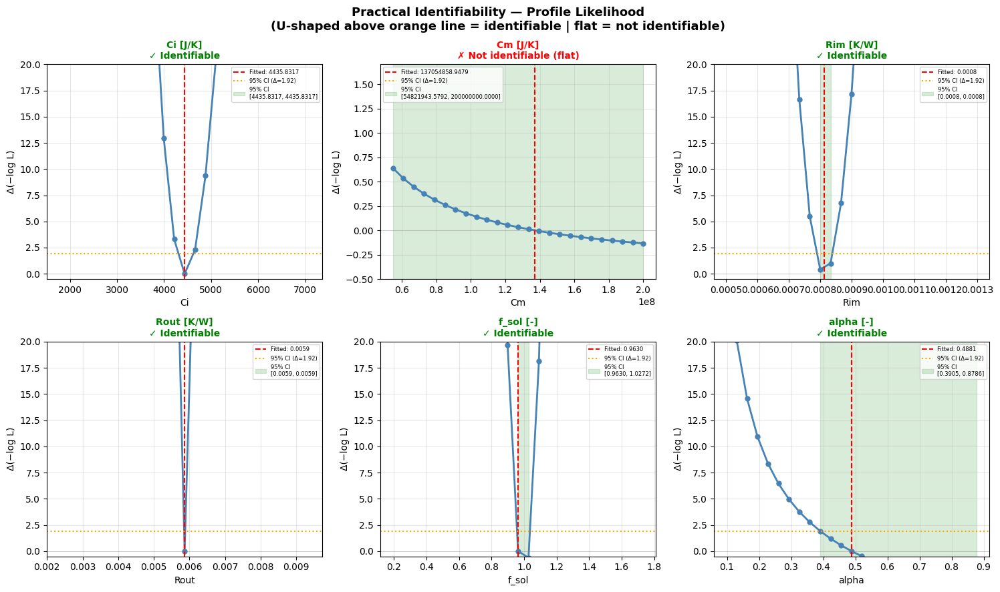

In [20]:
# ============================================================
# PRACTICAL IDENTIFIABILITY — PROFILE LIKELIHOOD (FIXED)
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import lmfit

# ----------------------------------------------------------
# HELPER — rebuild params from scratch (avoids deepcopy bug)
# ----------------------------------------------------------
def compute_nll_at_param(param_name, param_val, fitted_model, fitted_params, X, y_vals):
    """
    Fix param_name=param_val, hold all others at fitted values.
    Uses the EXISTING model instance directly — no re-instantiation.
    """
    # Build fresh lmfit Parameters (avoids deepcopy issues)
    p = lmfit.Parameters()
    for name, par in fitted_params.items():
        p.add(name,
              value = par.value,
              vary  = False,           # all fixed for forward-run
              min   = par.min if np.isfinite(par.min) else -np.inf,
              max   = par.max if np.isfinite(par.max) else  np.inf)

    # Override the one parameter being profiled
    p[param_name].value = param_val

    try:
        result  = fitted_model.model(p, X)
        Ti_pred = np.asarray(result.var['Ti'])
        res     = y_vals - Ti_pred
        n       = len(res)
        sigma2  = np.var(res, ddof=1)
        if sigma2 <= 0 or not np.isfinite(sigma2):
            return np.nan
        return 0.5 * n * np.log(2 * np.pi * sigma2) + 0.5 * np.sum(res**2) / sigma2
    except Exception as e:
        print(f"    ⚠ Error at {param_name}={param_val:.4f}: {e}")
        return np.nan


# ----------------------------------------------------------
# SETUP
# ----------------------------------------------------------
# Use the existing trained model instance from darkgreyfit
fitted_model  = model          # the DarkGreyModel instance from df.iloc[0]
fitted_params = model.result.params

# Training data — adjust variable names to match your notebook
y_train_vals = y_train.values        # numpy array
X_train_dict = X_train               # DataFrame or dict — whatever your model.model() expects

# Compute best -log L at fitted params (baseline = 0)
best_nll = compute_nll_at_param(
    'Ci', fitted_params['Ci'].value,   # dummy call with fitted value = baseline
    fitted_model, fitted_params, X_train_dict, y_train_vals
)
print(f"Baseline -log L at fitted params: {best_nll:.4f}")

# ----------------------------------------------------------
# PARAMETERS TO PROFILE
# ----------------------------------------------------------
# (param_name, display_label, n_grid_points, fraction_of_range_to_explore)
profile_params = [
    ('Ci',    'Ci [J/K]',   25, 0.60),
    ('Cm',    'Cm [J/K]',   25, 0.60),
    ('Rim',   'Rim [K/W]',  25, 0.60),
    ('Rout',  'Rout [K/W]', 25, 0.60),
    ('f_sol', 'f_sol [-]',  25, 0.80),
    ('alpha', 'alpha [-]',  25, 0.80),
]

# ----------------------------------------------------------
# COMPUTE PROFILES
# ----------------------------------------------------------
profiles = {}

for param_name, label, n_pts, rel_range in profile_params:
    if param_name not in fitted_params:
        print(f"  Skipping {param_name} — not in fitted_params")
        continue

    fitted_val = fitted_params[param_name].value
    p_min      = fitted_params[param_name].min
    p_max      = fitted_params[param_name].max

    # Grid: ±rel_range around fitted value, clamped to bounds
    lo   = max(p_min if np.isfinite(p_min) else fitted_val*0.01,
               fitted_val * (1 - rel_range))
    hi   = min(p_max if np.isfinite(p_max) else fitted_val*100,
               fitted_val * (1 + rel_range))
    grid = np.linspace(lo, hi, n_pts)

    print(f"\nProfiling {param_name} (fitted={fitted_val:.4f})  range=[{lo:.4f}, {hi:.4f}]")

    nll_vals = []
    for val in grid:
        nll = compute_nll_at_param(
            param_name, val,
            fitted_model, fitted_params,
            X_train_dict, y_train_vals
        )
        nll_vals.append(nll)
        print(f"  {param_name}={val:.4f}  →  -logL={nll:.4f}  Δ={nll - best_nll:.4f}")

    profiles[param_name] = {
        'label':      label,
        'grid':       grid,
        'nll':        np.array(nll_vals),
        'fitted_val': fitted_val,
        'best_nll':   best_nll,
    }

# ----------------------------------------------------------
# PLOT
# ----------------------------------------------------------
n_plots  = len(profiles)
ncols    = 3
nrows    = int(np.ceil(n_plots / ncols))
chi2_thr = 1.92   # χ²(1, 0.95) / 2

fig, axes = plt.subplots(nrows, ncols, figsize=(15, 4.5 * nrows))
axes = axes.flatten()

for i, (param_name, data) in enumerate(profiles.items()):
    ax  = axes[i]
    raw = data['nll']
    delta = raw - data['best_nll']

    # Replace NaN with large value for plotting
    delta_plot = np.where(np.isfinite(delta), delta, np.nanmax(delta[np.isfinite(delta)] if np.any(np.isfinite(delta)) else [20]))

    ax.plot(data['grid'], delta_plot, 'o-', color='steelblue', lw=2, ms=5)
    ax.axvline(data['fitted_val'], color='red',    ls='--', lw=1.5,
               label=f"Fitted: {data['fitted_val']:.4f}")
    ax.axhline(chi2_thr, color='orange', ls=':', lw=1.5,
               label=f'95% CI (Δ={chi2_thr})')
    ax.axhline(0, color='gray', ls='-', lw=0.5, alpha=0.4)

    # Shade 95% CI region
    ci_mask = delta_plot <= chi2_thr
    if ci_mask.any():
        ci_lo = data['grid'][ci_mask].min()
        ci_hi = data['grid'][ci_mask].max()
        ax.axvspan(ci_lo, ci_hi, alpha=0.15, color='green',
                   label=f'95% CI\n[{ci_lo:.4f}, {ci_hi:.4f}]')

    # Verdict
    max_delta = np.nanmax(delta_plot)
    if max_delta > chi2_thr and np.nanmin(delta_plot) < 0.5:
        verdict, col = '✓ Identifiable', 'green'
    elif max_delta < chi2_thr:
        verdict, col = '✗ Not identifiable (flat)', 'red'
    else:
        verdict, col = '⚠ Weakly identifiable', 'orange'

    ax.set_title(f'{data["label"]}\n{verdict}', color=col, fontweight='bold', fontsize=10)
    ax.set_xlabel(param_name); ax.set_ylabel('Δ(−log L)')
    ax.legend(fontsize=6); ax.grid(alpha=0.3)
    ax.set_ylim(-0.5, min(max_delta * 1.1 + 1, 20))

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle('Practical Identifiability — Profile Likelihood\n'
             '(U-shaped above orange line = identifiable | flat = not identifiable)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


## Plot the different heat gains

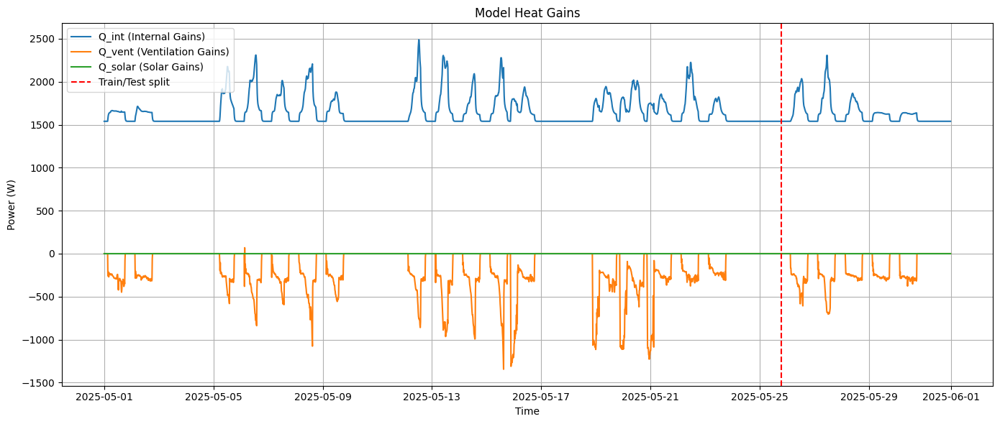

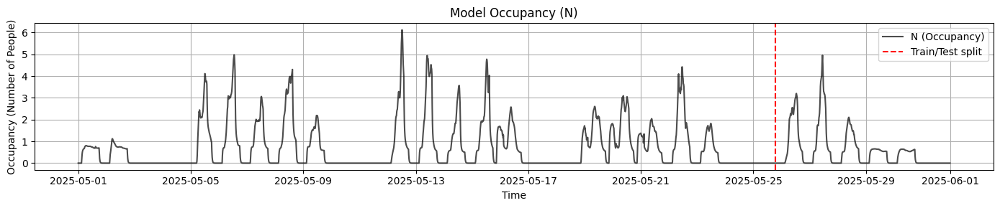

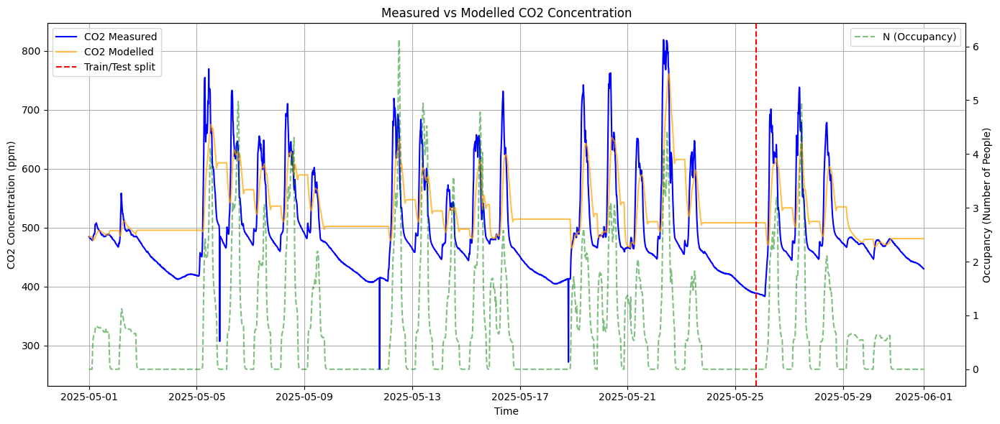

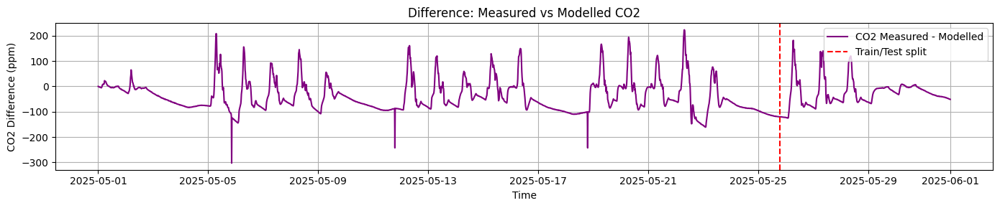

In [21]:
# Helper function to safely extract variables from results
def get_var(result, key, default=0):
    return result.var[key] if key in result.var else np.zeros(len(result.var[list(result.var.keys())[0]]))

# Extract Q_int, Q_vent, Q_solar, and N from train and test results
Q_int_train = get_var(train_results, 'Q_int')
Q_vent_train = get_var(train_results, 'Q_vent')
Q_solar_train = get_var(train_results, 'Q_solar')
N_train = get_var(train_results, 'N')

Q_int_test = get_var(test_results, 'Q_int')
Q_vent_test = get_var(test_results, 'Q_vent')
Q_solar_test = get_var(test_results, 'Q_solar')
N_test = get_var(test_results, 'N')

# Concatenate train and test for full time series
Q_int_full = np.concatenate([Q_int_train, Q_int_test])
Q_vent_full = np.concatenate([Q_vent_train, Q_vent_test])
Q_solar_full = np.concatenate([Q_solar_train, Q_solar_test])
N_full = np.concatenate([N_train, N_test])

# Get full index from y_train and y_test
full_index = pd.Index(list(y_train.index) + list(y_test.index))

# Plot heat gains
fig1, ax1 = plt.subplots(figsize=(14, 6))
ax1.plot(full_index, Q_int_full, label='Q_int (Internal Gains)')
ax1.plot(full_index, Q_vent_full, label='Q_vent (Ventilation Gains)')
ax1.plot(full_index, Q_solar_full, label='Q_solar (Solar Gains)')
ax1.axvline(x=y_train.index[-1], color='r', linestyle='--', label='Train/Test split')
ax1.set_xlabel('Time')
ax1.set_ylabel('Power (W)')
ax1.set_title('Model Heat Gains')
ax1.legend(loc='upper left')
ax1.grid(True)
plt.tight_layout()
plt.show()

# Plot N (occupancy) separately
fig2, ax2 = plt.subplots(figsize=(14, 3))
ax2.plot(full_index, N_full, color='black', label='N (Occupancy)', linewidth=1.5, alpha=0.7)
ax2.axvline(x=y_train.index[-1], color='r', linestyle='--', label='Train/Test split')
ax2.set_xlabel('Time')
ax2.set_ylabel('Occupancy (Number of People)')
ax2.set_title('Model Occupancy (N)')
ax2.legend(loc='upper right')
ax2.grid(True)
plt.tight_layout()
plt.show()


# Plot the difference between measured CO2 (c) and modelled CO2, along with N
# Extract measured and modelled CO2 concentrations
c_measured = pd.concat([input_df.loc[y_train.index, 'c'], input_df.loc[y_test.index, 'c']])
c_modelled = np.concatenate([get_var(train_results, 'c'), get_var(test_results, 'c')])

# Plot measured vs modelled CO2 and N
fig3, ax3 = plt.subplots(figsize=(14, 6))
ax3.plot(full_index, c_measured, label='CO2 Measured', color='blue')
ax3.plot(full_index, c_modelled, label='CO2 Modelled', color='orange', alpha=0.7)
ax3.axvline(x=y_train.index[-1], color='r', linestyle='--', label='Train/Test split')
ax3.set_xlabel('Time')
ax3.set_ylabel('CO2 Concentration (ppm)')
ax3.set_title('Measured vs Modelled CO2 Concentration')
ax3.legend(loc='upper left')
ax3.grid(True)

# Add a secondary axis for N
ax4 = ax3.twinx()
ax4.plot(full_index, N_full, label='N (Occupancy)', color='green', linestyle='--', alpha=0.5)
ax4.set_ylabel('Occupancy (Number of People)')
ax4.legend(loc='upper right')

plt.tight_layout()
plt.show()

# Plot the difference between measured and modelled CO2
fig4, ax5 = plt.subplots(figsize=(14, 3))
co2_diff = c_measured.values - c_modelled
ax5.plot(full_index, co2_diff, label='CO2 Measured - Modelled', color='purple')
ax5.axvline(x=y_train.index[-1], color='r', linestyle='--', label='Train/Test split')
ax5.set_xlabel('Time')
ax5.set_ylabel('CO2 Difference (ppm)')
ax5.set_title('Difference: Measured vs Modelled CO2')
ax5.legend(loc='upper right')
ax5.grid(True)
plt.tight_layout()
plt.show()

New results

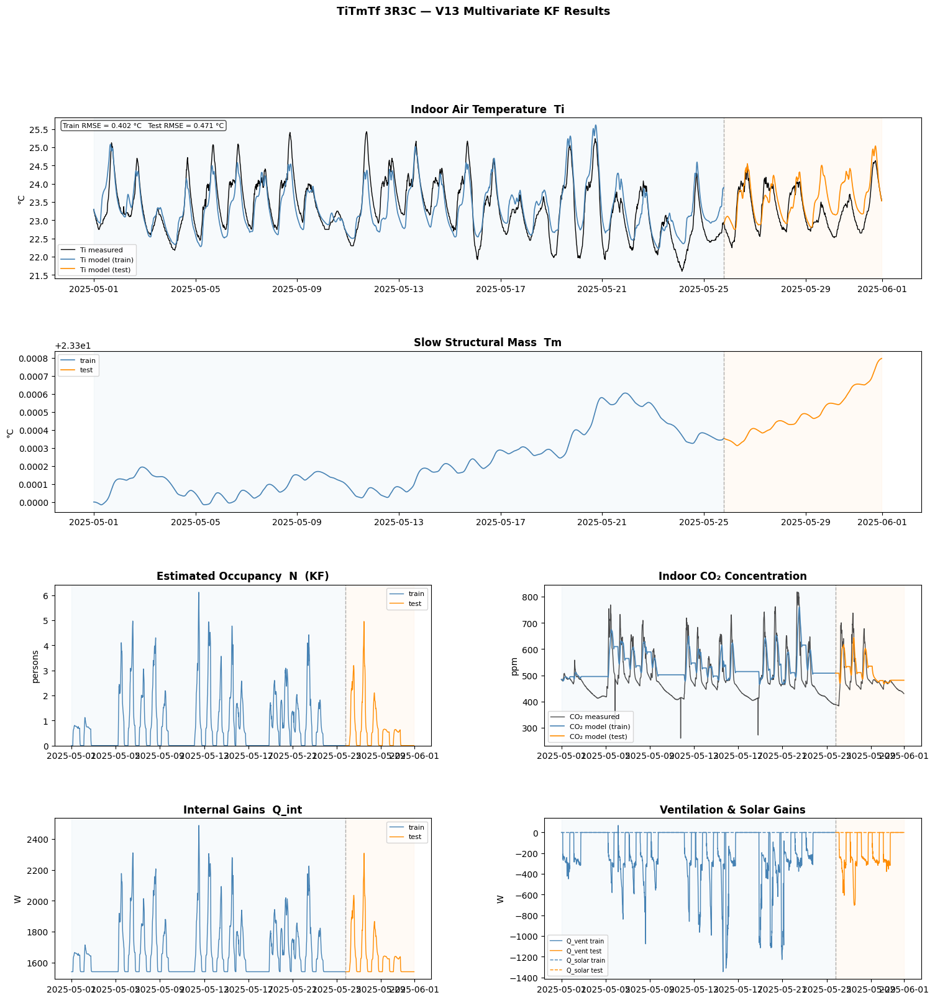

In [22]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

# ── Reconstruct time index ────────────────────────────────────────────────────
train_index = X_train.index
test_index  = X_test.index

# ── Unpack results ────────────────────────────────────────────────────────────
Ti_train   = get_var(train_results, 'Ti')
Tm_train   = get_var(train_results, 'Tm')
N_train    = get_var(train_results, 'N')
c_train    = get_var(train_results, 'c')
Qint_train = get_var(train_results, 'Q_int')
Qven_train = get_var(train_results, 'Q_vent')
Qsol_train = get_var(train_results, 'Q_solar')

Ti_test    = get_var(test_results, 'Ti')
Tm_test    = get_var(test_results, 'Tm')
N_test     = get_var(test_results, 'N')
c_test     = get_var(test_results, 'c')
Qint_test  = get_var(test_results, 'Q_int')
Qven_test  = get_var(test_results, 'Q_vent')
Qsol_test  = get_var(test_results, 'Q_solar')

c_meas_train = np.asarray(X_train['c'], dtype=float)
c_meas_test  = np.asarray(X_test['c'],  dtype=float)

# ── Figure layout — 4 rows, no innovation panel ───────────────────────────────
fig = plt.figure(figsize=(18, 18))
gs  = gridspec.GridSpec(4, 2, figure=fig, hspace=0.45, wspace=0.3)

ax_ti   = fig.add_subplot(gs[0, :])
ax_tm   = fig.add_subplot(gs[1, :])
ax_n    = fig.add_subplot(gs[2, 0])
ax_co2  = fig.add_subplot(gs[2, 1])
ax_qint = fig.add_subplot(gs[3, 0])
ax_qven = fig.add_subplot(gs[3, 1])

# ── Helper ────────────────────────────────────────────────────────────────────
def shade_split(ax):
    ax.axvline(test_index[0], color='grey', lw=1, ls='--', alpha=0.6)
    ax.axvspan(train_index[0], test_index[0],  alpha=0.04, color='steelblue')
    ax.axvspan(test_index[0],  test_index[-1], alpha=0.04, color='darkorange')

# ── 1. Ti ─────────────────────────────────────────────────────────────────────
ax_ti.plot(train_index, y_train,  color='black',      lw=1.0, label='Ti measured')
ax_ti.plot(train_index, Ti_train, color='steelblue',  lw=1.2, label='Ti model (train)')
ax_ti.plot(test_index,  y_test,   color='black',      lw=1.0)
ax_ti.plot(test_index,  Ti_test,  color='darkorange', lw=1.2, label='Ti model (test)')
shade_split(ax_ti)
ax_ti.set_title('Indoor Air Temperature  Ti', fontweight='bold')
ax_ti.set_ylabel('°C')
ax_ti.legend(fontsize=8)
ax_ti.text(0.01, 0.97,
    f'Train RMSE = {rmse(Ti_train, y_train.values):.3f} °C   '
    f'Test RMSE = {rmse(Ti_test, y_test.values):.3f} °C',
    transform=ax_ti.transAxes, va='top', fontsize=8,
    bbox=dict(boxstyle='round', fc='white', alpha=0.7))

# ── 2. Tm — full width ────────────────────────────────────────────────────────
ax_tm.plot(train_index, Tm_train, color='steelblue',  lw=1.2, label='train')
ax_tm.plot(test_index,  Tm_test,  color='darkorange', lw=1.2, label='test')
shade_split(ax_tm)
ax_tm.set_title('Slow Structural Mass  Tm', fontweight='bold')
ax_tm.set_ylabel('°C')
ax_tm.legend(fontsize=8)

# ── 3. Occupancy N ────────────────────────────────────────────────────────────
ax_n.plot(train_index, N_train, color='steelblue',  lw=1.0, label='train')
ax_n.plot(test_index,  N_test,  color='darkorange', lw=1.0, label='test')
ax_n.set_ylim(bottom=0)
shade_split(ax_n)
ax_n.set_title('Estimated Occupancy  N  (KF)', fontweight='bold')
ax_n.set_ylabel('persons')
ax_n.legend(fontsize=8)

# ── 4. CO2 ────────────────────────────────────────────────────────────────────
ax_co2.plot(train_index, c_meas_train, color='black',      lw=1.0, alpha=0.7, label='CO₂ measured')
ax_co2.plot(train_index, c_train,      color='steelblue',  lw=1.2, label='CO₂ model (train)')
ax_co2.plot(test_index,  c_meas_test,  color='black',      lw=1.0, alpha=0.7)
ax_co2.plot(test_index,  c_test,       color='darkorange', lw=1.2, label='CO₂ model (test)')
shade_split(ax_co2)
ax_co2.set_title('Indoor CO₂ Concentration', fontweight='bold')
ax_co2.set_ylabel('ppm')
ax_co2.legend(fontsize=8)

# ── 5. Internal heat gains ────────────────────────────────────────────────────
ax_qint.plot(train_index, Qint_train, color='steelblue',  lw=1.0, label='train')
ax_qint.plot(test_index,  Qint_test,  color='darkorange', lw=1.0, label='test')
shade_split(ax_qint)
ax_qint.set_title('Internal Gains  Q_int', fontweight='bold')
ax_qint.set_ylabel('W')
ax_qint.legend(fontsize=8)

# ── 6. Ventilation + solar ────────────────────────────────────────────────────
ax_qven.plot(train_index, Qven_train, color='steelblue',  lw=1.0, label='Q_vent train')
ax_qven.plot(test_index,  Qven_test,  color='darkorange', lw=1.0, label='Q_vent test')
ax_qven.plot(train_index, Qsol_train, color='steelblue',  lw=1.0, ls='--', label='Q_solar train')
ax_qven.plot(test_index,  Qsol_test,  color='darkorange', lw=1.0, ls='--', label='Q_solar test')
shade_split(ax_qven)
ax_qven.set_title('Ventilation & Solar Gains', fontweight='bold')
ax_qven.set_ylabel('W')
ax_qven.legend(fontsize=7)

# ── Save ──────────────────────────────────────────────────────────────────────
fig.suptitle('TiTmTf 3R3C — V13 Multivariate KF Results',
             fontsize=13, fontweight='bold')
plt.savefig('V13_results.png', dpi=150, bbox_inches='tight')
plt.show()
